In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import cv2
import pickle
import os, glob
import numpy as np
from moviepy.editor import VideoFileClip

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [3]:
def show_images(images, cmap=None):
    cols = 3
    rows = (len(images)+1)//cols
    
    plt.figure(figsize=(10, 10))
    for i, image in enumerate(images):
        plt.subplot(rows, cols, i+1)
        # use gray scale color map if there is only one channel
        cmap = 'gray' if len(image.shape)==2 else cmap
        plt.imshow(image, cmap=cmap)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout(pad=0, h_pad=4, w_pad=4)
    plt.show()

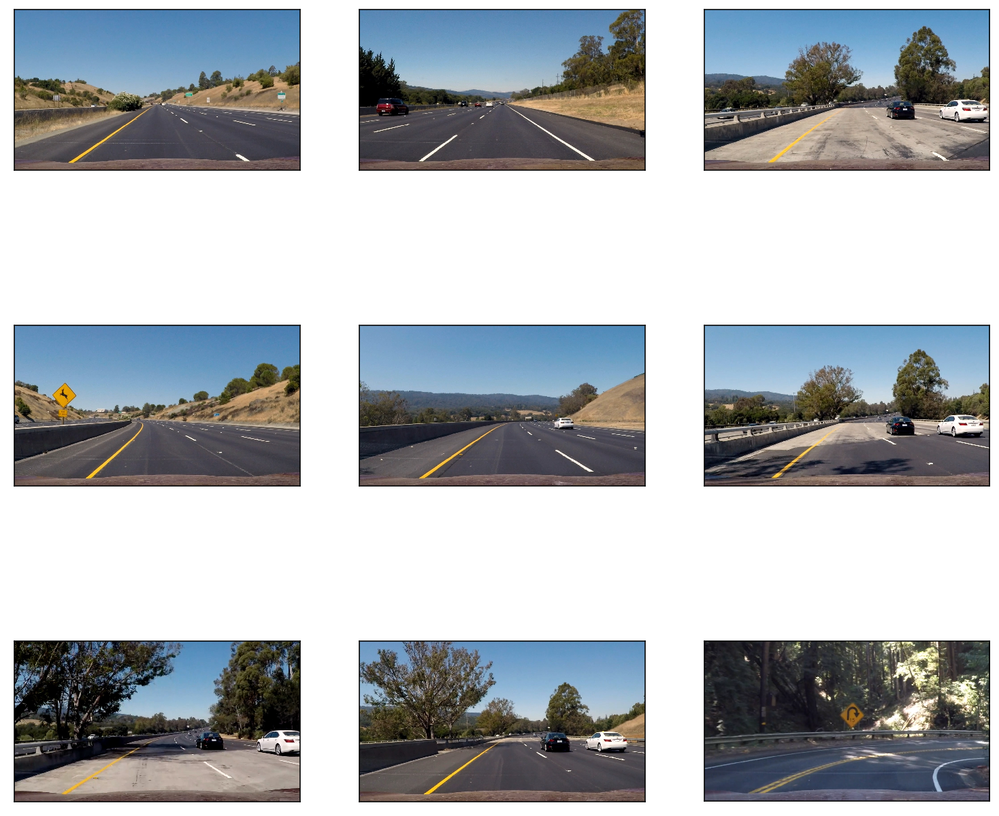

In [4]:
test_images = [plt.imread(path) for path in glob.glob('test_images/*.jpg')]

show_images(test_images)


In [5]:
def undistort_img():
    # Prepare object points 0,0,0 ... 8,5,0
    object_points = np.zeros((6*9,3), np.float32)
    object_points[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

    # Stores all object points & img points from all images
    objpoints = []
    imgpoints = []

    # Get directory for all calibration images
    images = glob.glob('camera_cal/*.jpg')

    for indx, fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

        if ret == True:
            objpoints.append(object_points)
            imgpoints.append(corners)
    # Test undistortion on img
    img_size = (img.shape[1], img.shape[0])

    # Calibrate camera
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None,None)

    dst = cv2.undistort(img, mtx, dist, None, mtx)
    # Save camera calibration for later use
    dist_pickle = {}
    dist_pickle['mtx'] = mtx
    dist_pickle['dist'] = dist
    pickle.dump( dist_pickle, open('camera_cal/cal_pickle.p', 'wb') )

def undistort(img, cal_dir='camera_cal/cal_pickle.p'):
    #cv2.imwrite('camera_cal/test_cal.jpg', dst)
    with open(cal_dir, mode='rb') as f:
        file = pickle.load(f)
    mtx = file['mtx']
    dist = file['dist']
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    
    return dst

In [6]:
undistort_img()

Text(0.5, 1.0, 'Undistorted')

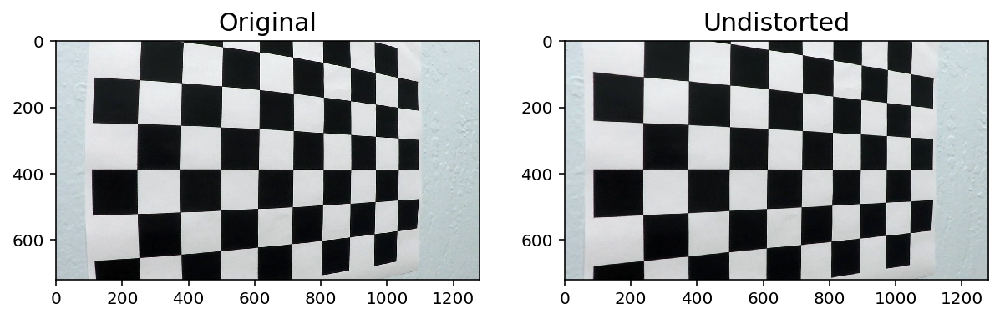

In [8]:
img = cv2.imread('camera_cal/calibration5.jpg')
dst = undistort(img)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,10))
ax1.imshow(img)
ax1.set_title('Original', fontsize=15)
ax2.imshow(dst)
ax2.set_title('Undistorted', fontsize=15)

Text(0.5, 1.0, 'Undistorted')

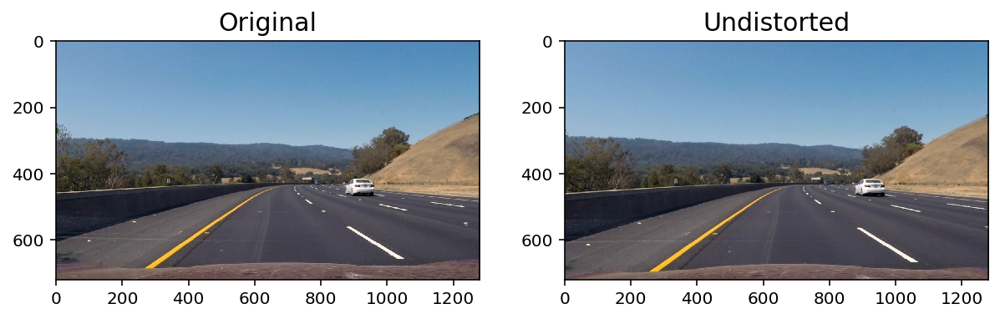

In [9]:
img = cv2.imread('test_images/test3.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
dst = undistort(img)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,10))
ax1.imshow(img)
ax1.set_title('Original', fontsize=15)
ax2.imshow(dst)
ax2.set_title('Undistorted', fontsize=15)

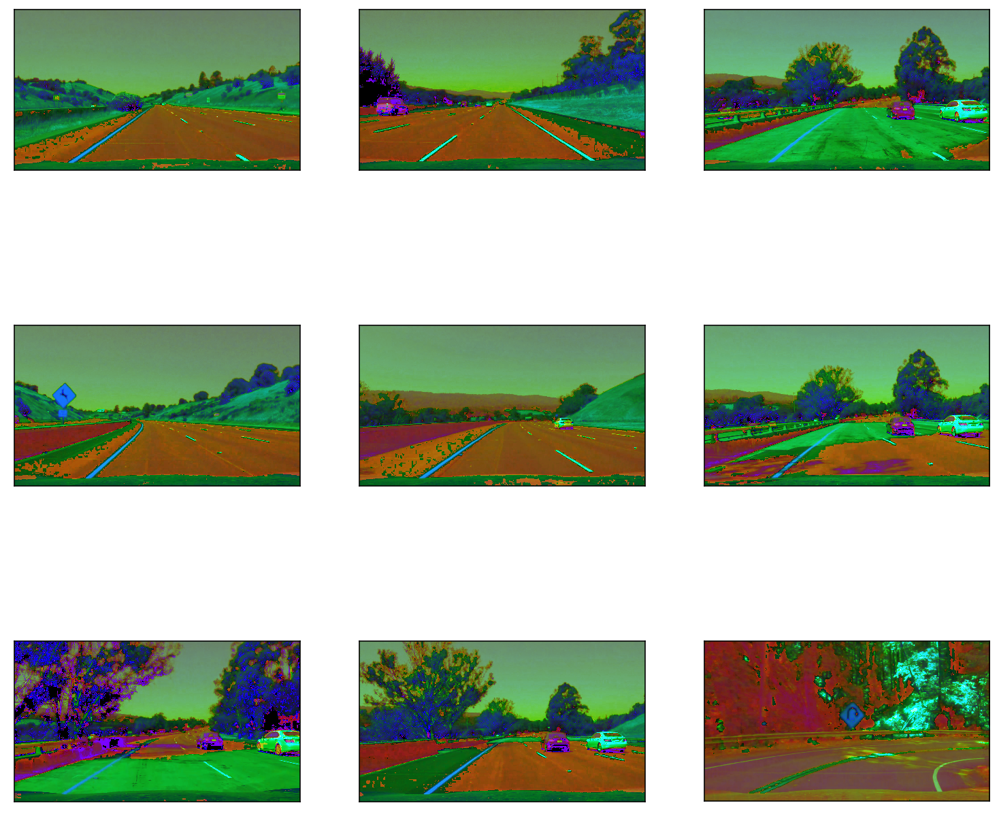

In [10]:
def convert_hls(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2HLS)

show_images(list(map(convert_hls, test_images)))

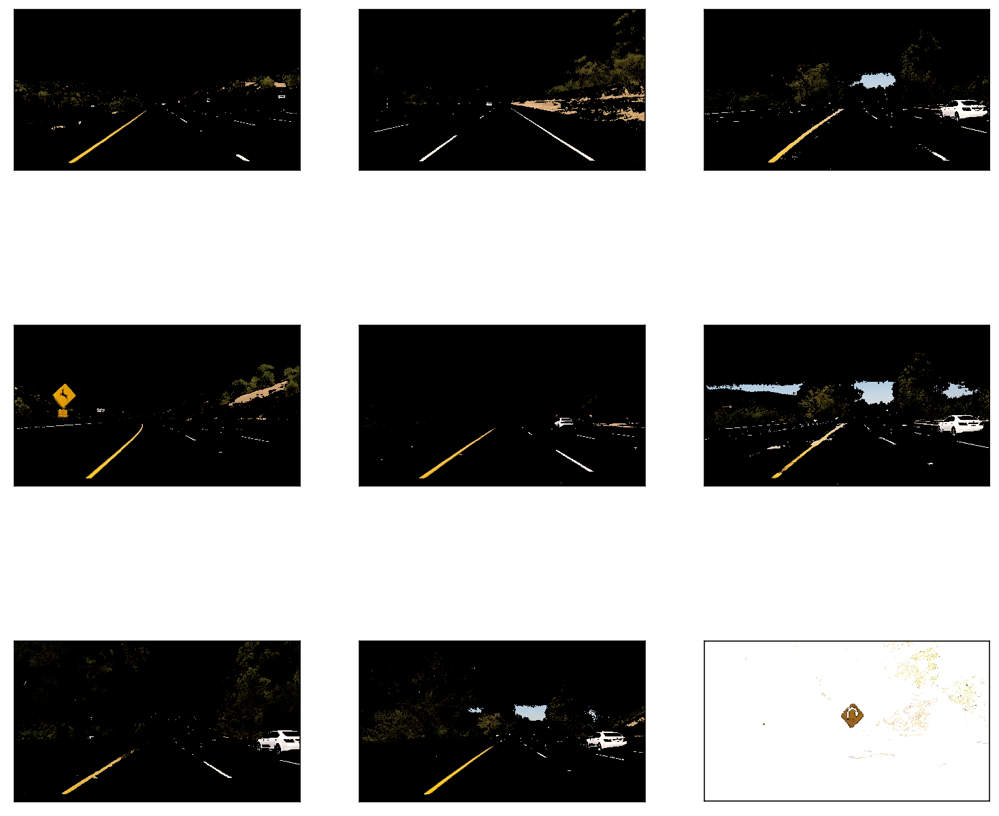

In [11]:
def select_white_yellow(image):
    converted = convert_hls(image)
    # white color mask
    lower = np.uint8([  0, 200,   0])
    upper = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(converted, lower, upper)
    # yellow color mask
    lower = np.uint8([ 10,   0, 100])
    upper = np.uint8([ 40, 255, 255])
    yellow_mask = cv2.inRange(converted, lower, upper)
    # combine the mask
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    return cv2.bitwise_and(image, image, mask = mask)

white_yellow_images = list(map(select_white_yellow, test_images))

show_images(white_yellow_images)

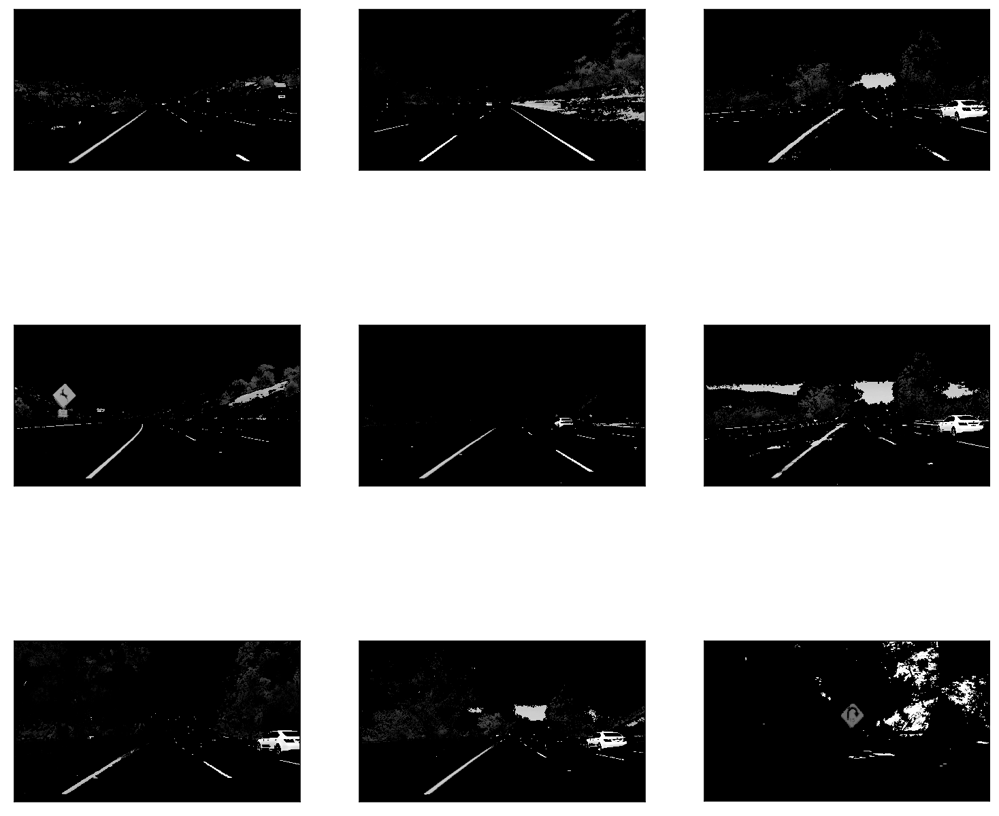

In [12]:
def convert_gray_scale(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

gray_images = list(map(convert_gray_scale, white_yellow_images))

show_images(gray_images)

In [14]:
def apply_smoothing(image, kernel_size=7):
    """
    kernel_size must be positive and odd
    """
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)


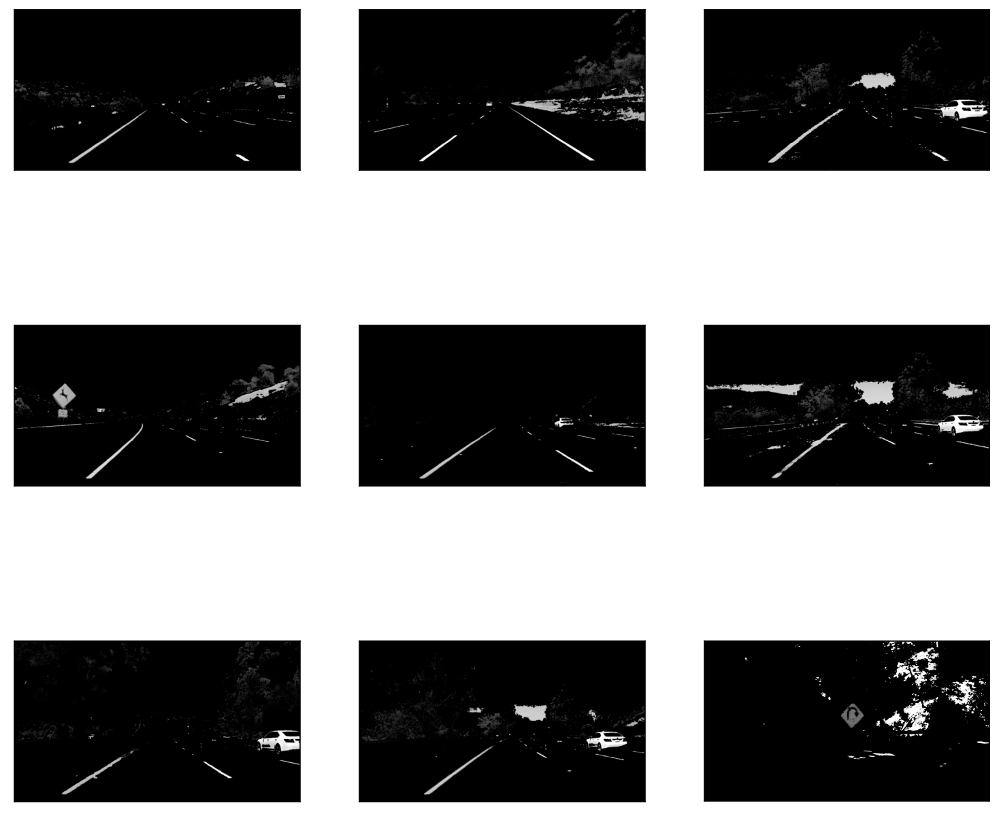

In [15]:
blurred_images = list(map(lambda image: apply_smoothing(image), gray_images))

show_images(blurred_images)

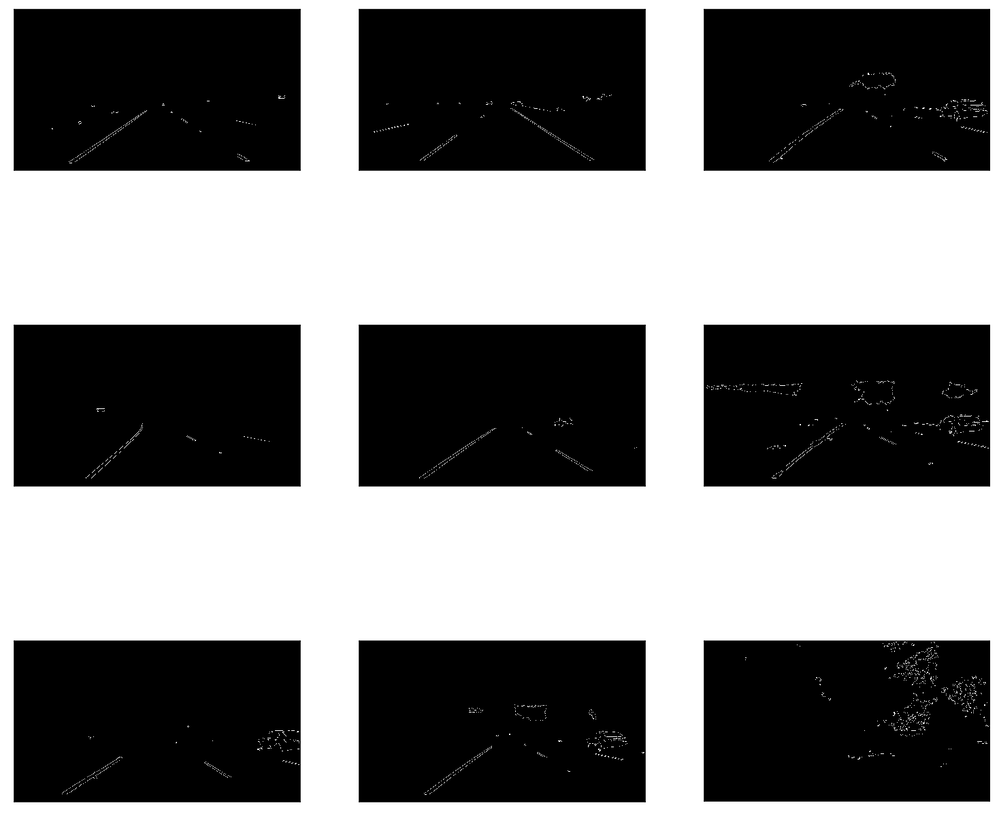

In [16]:
def detect_edges(image, low_threshold=200, high_threshold=500):
    return cv2.Canny(image, low_threshold, high_threshold)

edge_images = list(map(lambda image: detect_edges(image), blurred_images))

show_images(edge_images)

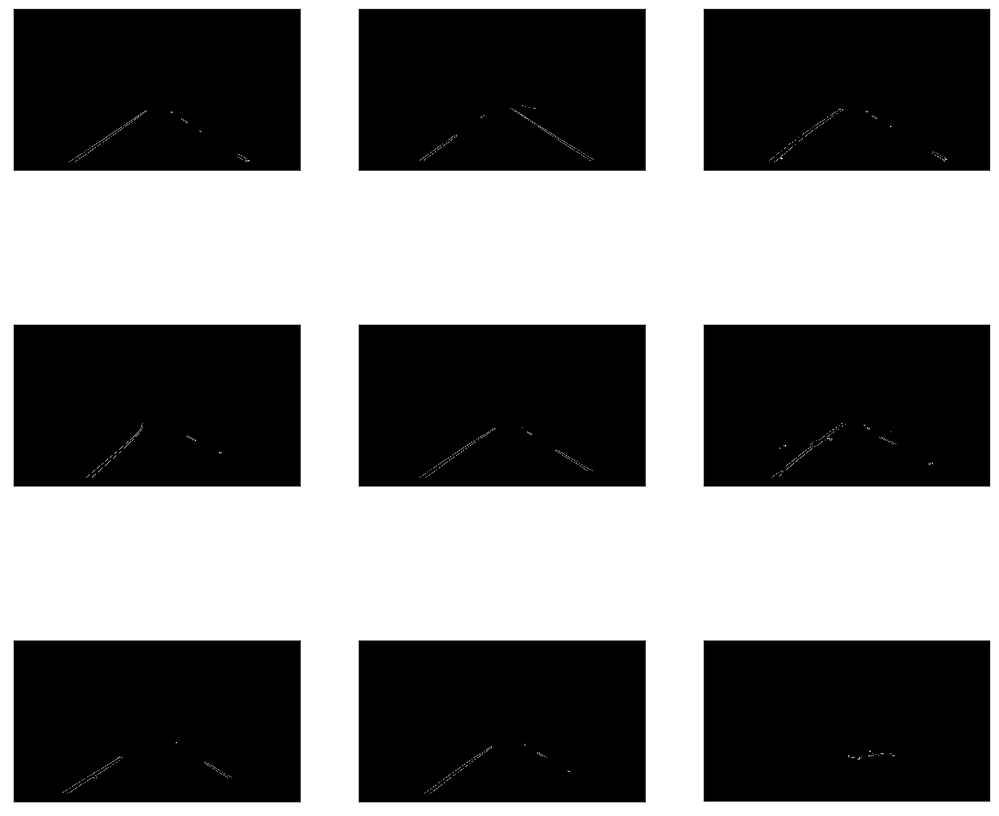

In [17]:
def filter_region(image, vertices):
    """
    Create the mask using the vertices and apply it to the input image
    """
    mask = np.zeros_like(image)
    if len(mask.shape)==2:
        cv2.fillPoly(mask, vertices, 255)
    else:
        cv2.fillPoly(mask, vertices, (255,)*mask.shape[2]) # in case, the input image has a channel dimension        
    return cv2.bitwise_and(image, mask)

    
def select_region(image):
    """
    It keeps the region surrounded by the `vertices` (i.e. polygon).  Other area is set to 0 (black).
    """
    # first, define the polygon by vertices
    rows, cols = image.shape[:2]
    bottom_left  = [cols*0.1, rows*0.95]
    top_left     = [cols*0.4, rows*0.6]
    bottom_right = [cols*0.9, rows*0.95]
    top_right    = [cols*0.6, rows*0.6] 
    # the vertices are an array of polygons (i.e array of arrays) and the data type must be integer
    vertices = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)
    return filter_region(image, vertices)


# images showing the region of interest only
roi_images = list(map(select_region, edge_images))

show_images(roi_images)

In [18]:
def hough_lines(image):
    """
    `image` should be the output of a Canny transform.
    
    Returns hough lines (not the image with lines)
    """
    return cv2.HoughLinesP(image, rho=1, theta=np.pi/180, threshold=20, minLineLength=20, maxLineGap=300)


list_of_lines = list(map(hough_lines, roi_images))

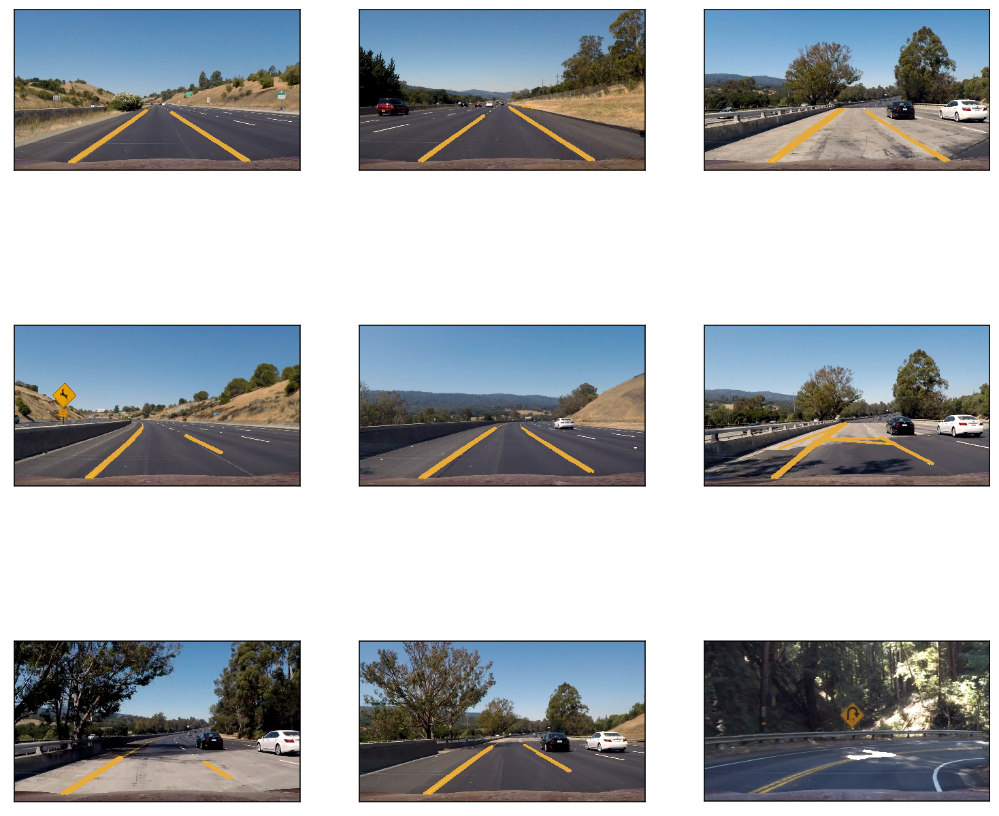

In [19]:
def draw_lines(image, lines, color=[230, 170, 60], thickness=10, make_copy=True):
    # the lines returned by cv2.HoughLinesP has the shape (-1, 1, 4)
    if make_copy:
        image = np.copy(image) # don't want to modify the original
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(image, (x1, y1), (x2, y2), color, thickness)
    return image


line_images = []
for image, lines in zip(test_images, list_of_lines):
    line_images.append(draw_lines(image, lines))
    
show_images(line_images)

In [20]:
def average_slope_intercept(lines):
    left_lines    = [] # (slope, intercept)
    left_weights  = [] # (length,)
    right_lines   = [] # (slope, intercept)
    right_weights = [] # (length,)
    
    for line in lines:
        for x1, y1, x2, y2 in line:
            if x2==x1:
                continue # ignore a vertical line
            slope = (y2-y1)/(x2-x1)
            intercept = y1 - slope*x1
            length = np.sqrt((y2-y1)**2+(x2-x1)**2)
            if slope < 0: # y is reversed in image
                left_lines.append((slope, intercept))
                left_weights.append((length))
            else:
                right_lines.append((slope, intercept))
                right_weights.append((length))
    
    # add more weight to longer lines    
    left_lane  = np.dot(left_weights,  left_lines) /np.sum(left_weights)  if len(left_weights) >0 else None
    right_lane = np.dot(right_weights, right_lines)/np.sum(right_weights) if len(right_weights)>0 else None
    
    return left_lane, right_lane # (slope, intercept), (slope, intercept)

In [21]:
def make_line_points(y1, y2, line):
    """
    Convert a line represented in slope and intercept into pixel points
    """
    if line is None:
        return None
    
    slope, intercept = line
    
    # make sure everything is integer as cv2.line requires it
    x1 = int((y1 - intercept)/slope)
    x2 = int((y2 - intercept)/slope)
    y1 = int(y1)
    y2 = int(y2)
    
    return ((x1, y1), (x2, y2))

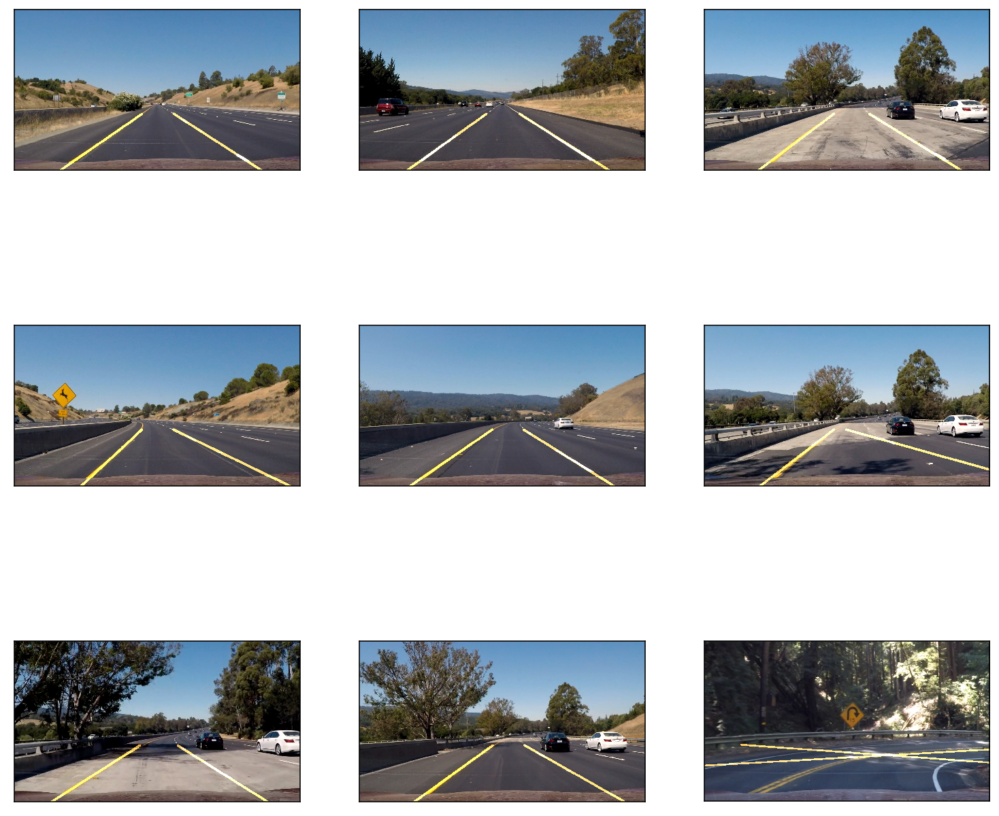

In [22]:
def lane_lines(image, lines):
    left_lane, right_lane = average_slope_intercept(lines)
    
    y1 = image.shape[0] # bottom of the image
    y2 = y1*0.65         # slightly lower than the middle

    left_line  = make_line_points(y1, y2, left_lane)
    right_line = make_line_points(y1, y2, right_lane)
    
    return left_line, right_line

    
def draw_lane_lines(image, lines, color=[230, 170, 60], thickness=10):
    # make a separate image to draw lines and combine with the orignal later
    line_image = np.zeros_like(image)
    for line in lines:
        if line is not None:
            cv2.line(line_image, *line,  color, thickness)
    # image1 * α + image2 * β + λ
    # image1 and image2 must be the same shape.
    return cv2.addWeighted(image, 1.0, line_image, 0.95, 0.0)
             
    
lane_images = []
for image, lines in zip(test_images, list_of_lines):
    lane_images.append(draw_lane_lines(image, lane_lines(image, lines)))

    
show_images(lane_images)

In [23]:
from collections import deque

QUEUE_LENGTH=100

class LaneDetector:
    def __init__(self):
        self.left_lines  = deque(maxlen=QUEUE_LENGTH)
        self.right_lines = deque(maxlen=QUEUE_LENGTH)

    def process(self, image):
        distortion = undistort(image)
        white_yellow = select_white_yellow(distortion)
        gray         = convert_gray_scale(white_yellow)
        smooth_gray  = apply_smoothing(gray)
        edges        = detect_edges(smooth_gray)
        regions      = select_region(edges)
        lines        = hough_lines(regions)
        left_line, right_line = lane_lines(image, lines)

        def mean_line(line, lines):
            if line is not None:
                lines.append(line)

            if len(lines)>0:
                line = np.mean(lines, axis=0, dtype=np.int32)
                line = tuple(map(tuple, line)) # make sure it's tuples not numpy array for cv2.line to work
            return line

        left_line  = mean_line(left_line,  self.left_lines)
        right_line = mean_line(right_line, self.right_lines)

        return draw_lane_lines(image, (left_line, right_line))

In [24]:
def process_video(video_input, video_output):
    detector = LaneDetector()

    clip = VideoFileClip(os.path.join('test_videos', video_input))
    processed = clip.fl_image(detector.process)
    processed.write_videofile(os.path.join('output_videos', video_output), audio=False)

In [134]:
%time process_video('harder_challenge_video.mp4', 'harder_challenge_video.mp4')

Moviepy - Building video output_videos\harder_challenge_video.mp4.


t:  77%|█████████████████████████████████████████████████▏              | 921/1199 [6:36:43<00:12, 22.65it/s, now=None]


t:  77%|█████████████████████████████████████████████████▏              | 921/1199 [1:00:25<00:12, 21.58it/s, now=None]

                                                                                                                       


                                                                                                                       
                                                                                                                       



Moviepy - Writing video output_videos\harder_challenge_video.mp4



t:  77%|█████████████████████████████████████████████████▏              | 921/1199 [6:36:43<00:12, 22.65it/s, now=None]


t:  77%|█████████████████████████████████████████████████▏              | 921/1199 [1:00:25<00:12, 21.58it/s, now=None]

t:  28%|██████████████████▌                                                | 134/485 [46:03<00:15, 22.13it/s, now=None]



t:   0%|                                                                            | 0/1199 [00:00<?, ?it/s, now=None]



t:   0%|▏                                                                   | 3/1199 [00:00<00:47, 25.21it/s, now=None]



t:   1%|▎                                                                   | 6/1199 [00:00<00:49, 24.23it/s, now=None]



t:   1%|▌                                                                   | 9/1199 [00:00<00:49, 23.99it/s, now=None]



t:   1%|▋                                                                  | 12/1199 [00:00<00:49, 23.99it/s, now=None]



t:   1%|▊          

TypeError: 'NoneType' object is not iterable

In [135]:
%time process_video('project_video.mp4', 'project_video.mp4')

Moviepy - Building video output_videos\project_video.mp4.


t:  77%|█████████████████████████████████████████████████▏              | 921/1199 [6:36:59<00:12, 22.65it/s, now=None]


t:  16%|██████████▍                                                       | 189/1199 [01:48<00:42, 23.56it/s, now=None]



t:  77%|█████████████████████████████████████████████████▏              | 921/1199 [1:00:41<00:12, 21.58it/s, now=None]

                                                                                                                       


                                                                                                                       



                                                                                                                       
                                                                                                                       



Moviepy - Writing video output_videos\project_video.mp4



t:  77%|█████████████████████████████████████████████████▏              | 921/1199 [6:36:59<00:12, 22.65it/s, now=None]


t:  16%|██████████▍                                                       | 189/1199 [01:48<00:42, 23.56it/s, now=None]



t:  77%|█████████████████████████████████████████████████▏              | 921/1199 [1:00:41<00:12, 21.58it/s, now=None]

t:  28%|██████████████████▌                                                | 134/485 [46:19<00:15, 22.13it/s, now=None]




t:   0%|                                                                            | 0/1260 [00:00<?, ?it/s, now=None]




t:   0%|▏                                                                   | 3/1260 [00:00<00:42, 29.41it/s, now=None]




t:   0%|▎                                                                   | 6/1260 [00:00<00:46, 27.25it/s, now=None]




t:   1%|▍                                                                   | 9/1260 [00:00<00:47, 26.60it/s, now=None]




t:   1%|▋     

t:  30%|███████████████████▊                                              | 378/1260 [00:16<00:38, 22.78it/s, now=None]




t:  30%|███████████████████▉                                              | 381/1260 [00:16<00:39, 22.26it/s, now=None]




t:  30%|████████████████████                                              | 384/1260 [00:16<00:39, 22.35it/s, now=None]




t:  31%|████████████████████▎                                             | 387/1260 [00:16<00:40, 21.63it/s, now=None]




t:  31%|████████████████████▍                                             | 390/1260 [00:16<00:39, 21.90it/s, now=None]




t:  31%|████████████████████▌                                             | 393/1260 [00:17<00:40, 21.43it/s, now=None]




t:  31%|████████████████████▋                                             | 396/1260 [00:17<00:39, 21.66it/s, now=None]




t:  32%|████████████████████▉                                             | 399/1260 [00:17<00:38, 22.17it/s, now=None]




t:  32%|

t:  61%|████████████████████████████████████████▍                         | 773/1260 [00:34<00:21, 23.06it/s, now=None]




t:  62%|████████████████████████████████████████▋                         | 776/1260 [00:34<00:20, 23.33it/s, now=None]




t:  62%|████████████████████████████████████████▊                         | 779/1260 [00:34<00:20, 23.26it/s, now=None]




t:  62%|████████████████████████████████████████▉                         | 782/1260 [00:34<00:20, 23.26it/s, now=None]




t:  62%|█████████████████████████████████████████                         | 785/1260 [00:34<00:20, 23.09it/s, now=None]




t:  63%|█████████████████████████████████████████▎                        | 788/1260 [00:34<00:20, 23.36it/s, now=None]




t:  63%|█████████████████████████████████████████▍                        | 791/1260 [00:34<00:19, 23.55it/s, now=None]




t:  63%|█████████████████████████████████████████▌                        | 794/1260 [00:34<00:20, 22.77it/s, now=None]




t:  63%|

t:  93%|████████████████████████████████████████████████████████████▎    | 1169/1260 [00:51<00:03, 23.27it/s, now=None]




t:  93%|████████████████████████████████████████████████████████████▍    | 1172/1260 [00:51<00:03, 23.00it/s, now=None]




t:  93%|████████████████████████████████████████████████████████████▌    | 1175/1260 [00:51<00:03, 22.97it/s, now=None]




t:  93%|████████████████████████████████████████████████████████████▊    | 1178/1260 [00:51<00:03, 23.60it/s, now=None]




t:  94%|████████████████████████████████████████████████████████████▉    | 1181/1260 [00:51<00:03, 23.28it/s, now=None]




t:  94%|█████████████████████████████████████████████████████████████    | 1184/1260 [00:51<00:03, 23.43it/s, now=None]




t:  94%|█████████████████████████████████████████████████████████████▏   | 1187/1260 [00:51<00:03, 23.49it/s, now=None]




t:  94%|█████████████████████████████████████████████████████████████▍   | 1190/1260 [00:52<00:02, 23.64it/s, now=None]




t:  95%|

Moviepy - Done !


t:  77%|█████████████████████████████████████████████████▏              | 921/1199 [6:37:55<00:12, 22.65it/s, now=None]


t:  16%|██████████▍                                                       | 189/1199 [02:44<00:42, 23.56it/s, now=None]



t:  77%|█████████████████████████████████████████████████▏              | 921/1199 [1:01:36<00:12, 21.58it/s, now=None]

                                                                                                                       


                                                                                                                       



                                                                                                                       
                                                                                                                       



Moviepy - video ready output_videos\project_video.mp4


t:  77%|█████████████████████████████████████████████████▏              | 921/1199 [6:37:55<00:12, 22.65it/s, now=None]


t:  16%|██████████▍                                                       | 189/1199 [02:44<00:42, 23.56it/s, now=None]



t:  77%|█████████████████████████████████████████████████▏              | 921/1199 [1:01:36<00:12, 21.58it/s, now=None]

t:  28%|██████████████████▌                                                | 134/485 [47:15<00:15, 22.13it/s, now=None]

Wall time: 56.3 s


In [136]:
%time process_video('challenge_video.mp4', 'challenge_video.mp4')

Moviepy - Building video output_videos\challenge_video.mp4.


t:  77%|█████████████████████████████████████████████████▏              | 921/1199 [6:38:42<00:12, 22.65it/s, now=None]


t:  16%|██████████▍                                                       | 189/1199 [03:31<00:42, 23.56it/s, now=None]



t:  77%|█████████████████████████████████████████████████▏              | 921/1199 [1:02:23<00:12, 21.58it/s, now=None]

                                                                                                                       


                                                                                                                       



                                                                                                                       
                                                                                                                       



Moviepy - Writing video output_videos\challenge_video.mp4



t:  77%|█████████████████████████████████████████████████▏              | 921/1199 [6:38:42<00:12, 22.65it/s, now=None]


t:  16%|██████████▍                                                       | 189/1199 [03:31<00:42, 23.56it/s, now=None]



t:  77%|█████████████████████████████████████████████████▏              | 921/1199 [1:02:23<00:12, 21.58it/s, now=None]

t:  28%|██████████████████▌                                                | 134/485 [48:02<00:15, 22.13it/s, now=None]




t:   0%|                                                                             | 0/485 [00:00<?, ?it/s, now=None]




t:   1%|▍                                                                    | 3/485 [00:00<00:17, 27.52it/s, now=None]




t:   1%|▊                                                                    | 6/485 [00:00<00:18, 26.57it/s, now=None]

TypeError: 'NoneType' object is not iterable






t:   1%|▉                                                                    | 7/485 [00:16<00:17, 26.57it/s, now=None]